# Trabajo Práctico 1 - Laboratorio de Datos - 1C 2025

**Integrantes del grupo:Franco Salazar** 

In [49]:
# Si requieren mas librerias, pueden importarlas aca
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import seaborn.objects as so
import json
import plotly.express as px
from formulaic import Formula
from sklearn import linear_model  
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error  
import unicodedata

In [50]:
df_educacion = pd.read_csv('indicadores-proceso-trayectoria-sobreedad-2012_2022.csv')

### Procesamiento de Datos

In [51]:
zona_norte = ['San Isidro', 'Vicente Lopez', 'General San Martin', 'San Fernando', 'Tigre']
zona_oeste = ['Moron', 'Tres de Febrero', 'La Matanza', 'Merlo', 'Moreno']
zona_sur = ['Almirante Brown', 'Avellaneda', 'Quilmes', 'Lanus', 'Florencio Varela', 'Berazategui', 'Lomas de Zamora', 'Esteban Echeverria']

**EJERCICIO 1**

In [52]:
df_educacion.dtypes 


anio                                  int64
municipio_id                          int64
municipio_nombre                     object
promocion_efectiva_primaria         float64
promocion_efectiva_secundaria       float64
repitencia_primaria                 float64
repitencia_secundaria               float64
reinscripcion_primaria              float64
reinscripcion_secundaria            float64
abandono_interanual_primaria        float64
abandono_interanual_secundaria      float64
alumnos_promovidos_primaria         float64
alumnos_promovidos_secundaria       float64
alumnos_no_promovidos_primaria      float64
alumnos_no_promovidos_secundaria    float64
salidos_sin_pase_primaria           float64
salidos_sin_pase_secundaria         float64
salidos_con_pase_primaria           float64
salidos_con_pase_secundaria         float64
sobreedad_primaria                  float64
sobreedad_secundaria                float64
sobreedad_avanzada_primaria         float64
sobreedad_avanzada_secundaria   

**EJERCICIO 2**

In [53]:
datos_faltantes=df_educacion.isna().sum().sum()
display(f"Contiente {datos_faltantes} datos faltantes")

'Contiente 0 datos faltantes'

**EJERCICIO 3**

**Ejercicio 3 - Inciso a**

In [54]:
def determinar_zona(x):
    if x in zona_norte:
        return 'Norte'
    elif x in zona_oeste:
        return 'Oeste'
    elif x in zona_sur:
        return 'Sur'
    else:
        return 'Interior'

**Ejercicio 3 - Inciso b**

In [55]:
df_educacion["zona"]=df_educacion["municipio_nombre"].apply(determinar_zona)
df_educacion

,anio,municipio_id,municipio_nombre,promocion_efectiva_primaria,promocion_efectiva_secundaria,repitencia_primaria,repitencia_secundaria,reinscripcion_primaria,reinscripcion_secundaria,abandono_interanual_primaria,...,alumnos_no_promovidos_secundaria,salidos_sin_pase_primaria,salidos_sin_pase_secundaria,salidos_con_pase_primaria,salidos_con_pase_secundaria,sobreedad_primaria,sobreedad_secundaria,sobreedad_avanzada_primaria,sobreedad_avanzada_secundaria,zona
0,2012,6007,Adolfo Alsina,100.26,84.14,1.25,9.06,0.07,1.79,-1.57,...,18.54,0.00,2.71,5.40,2.90,12.61,26.77,4.01,12.28,Interior
1,2013,6007,Adolfo Alsina,97.35,86.84,1.68,5.31,0.13,0.12,0.84,...,9.48,0.30,2.77,5.02,5.72,10.27,26.27,3.42,11.51,Interior
2,2014,6007,Adolfo Alsina,97.36,80.79,2.23,2.52,0.07,0.43,0.34,...,9.13,0.13,2.11,4.84,4.31,8.46,25.06,2.51,9.17,Interior
3,2015,6007,Adolfo Alsina,96.00,91.55,2.41,5.24,0.21,0.85,1.38,...,8.62,0.33,2.49,4.96,4.64,7.16,30.85,1.86,10.51,Interior
4,2016,6007,Adolfo Alsina,97.67,95.56,2.61,7.27,0.07,1.29,-0.35,...,6.95,0.14,2.79,4.72,3.57,6.81,26.13,1.69,8.24,Interior
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1480,2018,6882,Zarate,95.42,87.30,3.83,8.27,0.06,1.80,0.69,...,12.39,0.09,2.37,2.42,3.58,7.91,28.77,2.06,11.73,Interior
1481,2019,6882,Zarate,95.62,86.58,3.55,9.53,0.01,0.83,0.82,...,13.63,0.08,0.51,3.30,3.67,8.10,27.71,1.89,10.12,Interior
1482,2020,6882,Zarate,99.51,99.06,0.04,0.00,0.00,0.09,0.45,...,0.58,0.03,0.05,3.12,3.62,6.81,28.88,1.65,11.53,Interior
1483,2021,6882,Zarate,96.77,90.87,2.79,6.60,0.17,0.64,0.28,...,8.23,0.03,0.25,1.28,0.66,4.50,27.81,0.89,11.15,Interior


**EJERCICIO 4**

**Ejercicio 4 - Inciso a**

In [56]:
df_educacion["mayor_repitencia_primaria"]=df_educacion["repitencia_primaria"]>df_educacion["repitencia_secundaria"]
df_educacion

,anio,municipio_id,municipio_nombre,promocion_efectiva_primaria,promocion_efectiva_secundaria,repitencia_primaria,repitencia_secundaria,reinscripcion_primaria,reinscripcion_secundaria,abandono_interanual_primaria,...,salidos_sin_pase_primaria,salidos_sin_pase_secundaria,salidos_con_pase_primaria,salidos_con_pase_secundaria,sobreedad_primaria,sobreedad_secundaria,sobreedad_avanzada_primaria,sobreedad_avanzada_secundaria,zona,mayor_repitencia_primaria
0,2012,6007,Adolfo Alsina,100.26,84.14,1.25,9.06,0.07,1.79,-1.57,...,0.00,2.71,5.40,2.90,12.61,26.77,4.01,12.28,Interior,False
1,2013,6007,Adolfo Alsina,97.35,86.84,1.68,5.31,0.13,0.12,0.84,...,0.30,2.77,5.02,5.72,10.27,26.27,3.42,11.51,Interior,False
2,2014,6007,Adolfo Alsina,97.36,80.79,2.23,2.52,0.07,0.43,0.34,...,0.13,2.11,4.84,4.31,8.46,25.06,2.51,9.17,Interior,False
3,2015,6007,Adolfo Alsina,96.00,91.55,2.41,5.24,0.21,0.85,1.38,...,0.33,2.49,4.96,4.64,7.16,30.85,1.86,10.51,Interior,False
4,2016,6007,Adolfo Alsina,97.67,95.56,2.61,7.27,0.07,1.29,-0.35,...,0.14,2.79,4.72,3.57,6.81,26.13,1.69,8.24,Interior,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1480,2018,6882,Zarate,95.42,87.30,3.83,8.27,0.06,1.80,0.69,...,0.09,2.37,2.42,3.58,7.91,28.77,2.06,11.73,Interior,False
1481,2019,6882,Zarate,95.62,86.58,3.55,9.53,0.01,0.83,0.82,...,0.08,0.51,3.30,3.67,8.10,27.71,1.89,10.12,Interior,False
1482,2020,6882,Zarate,99.51,99.06,0.04,0.00,0.00,0.09,0.45,...,0.03,0.05,3.12,3.62,6.81,28.88,1.65,11.53,Interior,True
1483,2021,6882,Zarate,96.77,90.87,2.79,6.60,0.17,0.64,0.28,...,0.03,0.25,1.28,0.66,4.50,27.81,0.89,11.15,Interior,False


**Ejercicio 4 - Inciso b**

In [57]:
df_copia=df_educacion.copy()

df_copia=df_copia[df_copia["anio"].isin([2017,2018,2019,2020,2021,2022])]

serie_resultado=df_copia.groupby("municipio_nombre")["mayor_repitencia_primaria"].sum()

serie_resultado


municipio_nombre
25 de Mayo                1
9 de Julio                0
Adolfo Alsina             1
Adolfo Gonzales Chaves    1
Alberti                   1
                         ..
Tres de Febrero           1
Vicente Lopez             1
Villa Gesell              2
Villarino                 1
Zarate                    1
Name: mayor_repitencia_primaria, Length: 135, dtype: int64

**Ejercicio 4 - Inciso c**

In [58]:
df_agrupado=df_educacion.groupby(["anio","zona"])[["repitencia_primaria","repitencia_secundaria"]].mean().reset_index() 

df_agrupado


,anio,zona,repitencia_primaria,repitencia_secundaria
0,2012,Interior,2.457350,10.699316
1,2012,Norte,1.634000,8.978000
2,2012,Oeste,2.346000,9.932000
3,2012,Sur,2.470000,10.208750
4,2013,Interior,1.771368,10.499402
5,2013,Norte,1.098000,7.976000
6,2013,Oeste,1.728000,9.650000
7,2013,Sur,1.608750,10.792500
8,2014,Interior,1.763333,9.676923
9,2014,Norte,1.176000,8.098000


### Regresión

In [59]:
area_metropolitana = ['Almirante Brown', 'Avellaneda', 'Berazategui', 'Berisso', 'Brandsen', 'Campana', 'Cañuelas',
                      'Ensenada', 'Escobar', 'Esteban Echeverria', 'Exaltacion de la Cruz', 'Ezeiza',
                      'Florencio Varela', 'General Las Heras', 'General Rodriguez', 'General San Martin', 'Hurlingham',
                      'Ituzaingo', 'Jose C. Paz', 'La Matanza', 'La Plata', 'Lanus', 'Lujan', 'Lomas de Zamora',
                      'Malvinas Argentinas', 'Marcos Paz', 'Merlo', 'Moreno', 'Moron', 'Pilar', 'Presidente Peron',
                      'Quilmes', 'San Fernando', 'San Isidro', 'San Miguel', 'San Vicente', 'Tigre', 'Tres de Febrero',
                      'Vicente Lopez', 'Zarate']

**EJERCICIO 1**

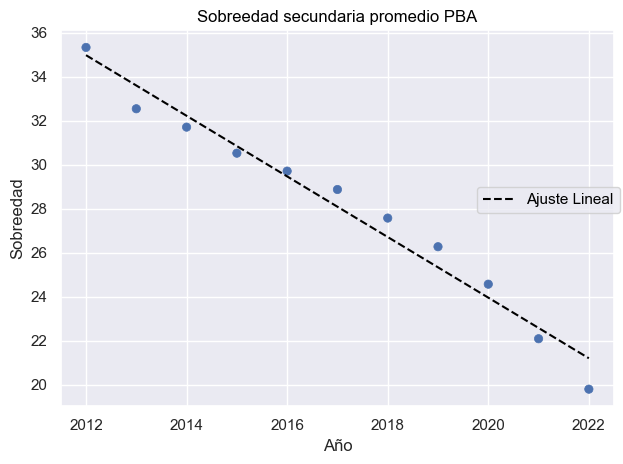

In [60]:
serie=df_educacion.groupby("anio")["sobreedad_secundaria"].mean().rename("sobreedad_secundaria") #Creo el data frame que voy a usar para el ejercicio
df_comparacion=serie.reset_index()

y , X = Formula('sobreedad_secundaria ~ anio').get_model_matrix(df_comparacion) 
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]
df_comparacion["modelo_predict"]=beta_0 + df_comparacion["anio"] * beta_1

(
    so.Plot()
    .add(so.Dot(), data=df_comparacion, x="anio", y="sobreedad_secundaria")
    .add(so.Line(color="Black",linestyle='--'), data=df_comparacion, x="anio", y="modelo_predict", label="Ajuste Lineal")
    .label(title="Sobreedad secundaria promedio PBA", x="Año", y="Sobreedad")
).show()


**EJERCICIO 2**

In [61]:
prediccion_2025=beta_0 + 2025 * beta_1# Aclarar que use lo de antes.
prediccion_2025

np.float64(17.075587878787246)

**EJERCICIO 3**


In [62]:
prediccion_data=[]
menor_que_promedio_data=[]

for partido in area_metropolitana:
    df_filtrado=df_educacion[df_educacion["municipio_nombre"]==partido]
    y , X = Formula('sobreedad_secundaria ~ anio').get_model_matrix(df_filtrado)

    modelo=linear_model.LinearRegression(fit_intercept=False)
    modelo.fit(X,y)

    beta = modelo.coef_
    beta_0 = beta[0][0]
    beta_1 = beta[0][1]

    anio_prediccion=beta_0 + 2025 * beta_1
    menor_promedio= anio_prediccion<prediccion_2025

    prediccion_data.append(anio_prediccion)
    menor_que_promedio_data.append(menor_promedio)

prediccion_df=pd.DataFrame(data={'sobreedad_2025':prediccion_data,'mejor_que_promedio':menor_que_promedio_data},index=area_metropolitana)

prediccion_df



,sobreedad_2025,mejor_que_promedio
Almirante Brown,15.068727,True
Avellaneda,24.418727,False
Berazategui,19.230182,False
Berisso,28.410727,False
Brandsen,20.656727,False
Campana,16.311273,True
Cañuelas,20.287091,False
Ensenada,20.784000,False
Escobar,18.443636,False
Esteban Echeverria,19.464909,False


### Visualización con datos geográficos

**EJERCICIO 1**

In [63]:
geo_df = gpd.read_file('partidos.geojson')
geo_df

,cca,cde,fna,gna,nam,sag,ara3,arl,geometry
0,045,06357,Partido de General Pueyrredón,Partido,General Pueyrredón,ARBA,1463.50,1460.74,"MULTIPOLYGON (((-57.54 -38.06, -57.53 -38.05, ..."
1,055,06441,Partido de La Plata,Partido,La Plata,ARBA,892.63,942.23,"MULTIPOLYGON (((-58.14 -34.99, -58.13 -35, -58..."
2,070,06427,Partido de La Matanza,Partido,La Matanza,ARBA,328.19,329.22,"MULTIPOLYGON (((-58.58 -34.65, -58.58 -34.65, ..."
3,030,06260,Partido de Esteban Echeverría,Partido,Esteban Echeverría,ARBA,120.45,120.22,"MULTIPOLYGON (((-58.51 -34.73, -58.51 -34.73, ..."
4,074,06560,Partido de Moreno,Partido,Moreno,ARBA,186.05,186.13,"MULTIPOLYGON (((-58.78 -34.56, -58.77 -34.56, ..."
...,...,...,...,...,...,...,...,...,...
138,132,06412,Partido de José C. Paz,Partido,José C. Paz,ARBA,50.01,50.16,"MULTIPOLYGON (((-58.81 -34.48, -58.81 -34.48, ..."
139,314,06126,Partido de Islas Campana,Partido,Islas Campana,ARBA,682.96,NaN,"MULTIPOLYGON (((-58.9 -33.96, -58.9 -33.96, -5..."
140,113,06182,Partido de Coronel Rosales,Partido,Coronel Rosales,ARBA,1283.36,1622.60,"MULTIPOLYGON (((-61.74 -38.63, -61.74 -38.63, ..."
141,357,06805,Partido de Islas Tigre,Partido,Islas Tigre,ARBA,280.36,NaN,"MULTIPOLYGON (((-58.65 -34.27, -58.64 -34.27, ..."


**EJERCICIO 2**

In [64]:
geo_df[geo_df.duplicated(subset="cde",keep=False)]["nam"]

28                  Ramallo
29              San Nicolás
35                   Zárate
38                  Campana
58                    Tigre
65                 Baradero
76                Chascomús
103            San Fernando
104               San Pedro
126          Islas Baradero
127         Islas de Zárate
128      Islas San Fernando
130           Islas Ramallo
131         Islas San Pedro
135                  Lezama
139           Islas Campana
141             Islas Tigre
142    Islas de San Nicolas
Name: nam, dtype: object

**EJERCICIO 3**

**Ejercicio 3 - Inciso a**

In [65]:
geo_df=geo_df[geo_df["nam"].apply(lambda x : not x.startswith('Islas'))]

geo_df

,cca,cde,fna,gna,nam,sag,ara3,arl,geometry
0,045,06357,Partido de General Pueyrredón,Partido,General Pueyrredón,ARBA,1463.50,1460.74,"MULTIPOLYGON (((-57.54 -38.06, -57.53 -38.05, ..."
1,055,06441,Partido de La Plata,Partido,La Plata,ARBA,892.63,942.23,"MULTIPOLYGON (((-58.14 -34.99, -58.13 -35, -58..."
2,070,06427,Partido de La Matanza,Partido,La Matanza,ARBA,328.19,329.22,"MULTIPOLYGON (((-58.58 -34.65, -58.58 -34.65, ..."
3,030,06260,Partido de Esteban Echeverría,Partido,Esteban Echeverría,ARBA,120.45,120.22,"MULTIPOLYGON (((-58.51 -34.73, -58.51 -34.73, ..."
4,074,06560,Partido de Moreno,Partido,Moreno,ARBA,186.05,186.13,"MULTIPOLYGON (((-58.78 -34.56, -58.77 -34.56, ..."
...,...,...,...,...,...,...,...,...,...
135,137,06217,Partido de Lezama,Partido,Lezama,ARBA,1044.82,1035.39,"MULTIPOLYGON (((-57.86 -35.69, -57.86 -35.69, ..."
136,127,06847,Partido de Tres Lomas,Partido,Tres Lomas,ARBA,1255.10,1262.45,"MULTIPOLYGON (((-62.94 -36.25, -62.94 -36.25, ..."
137,108,06833,Partido de Tres Arroyos,Partido,Tres Arroyos,ARBA,5935.60,5962.88,"MULTIPOLYGON (((-60.68 -38.09, -60.67 -38.1, -..."
138,132,06412,Partido de José C. Paz,Partido,José C. Paz,ARBA,50.01,50.16,"MULTIPOLYGON (((-58.81 -34.48, -58.81 -34.48, ..."


**Ejercicio 3 - Inciso b**

In [66]:
geo_df["cde"]=geo_df["cde"].astype(int)

geo_df["cde"].info()

<class 'pandas.core.series.Series'>
Index: 135 entries, 0 to 140
Series name: cde
Non-Null Count  Dtype
--------------  -----
135 non-null    int64
dtypes: int64(1)
memory usage: 2.1 KB


c:\Users\Electro-Hard\AppData\Local\Programs\Python\Python313\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Ejercicio 3 - Inciso c**

In [67]:
lezama_id=df_educacion[df_educacion["municipio_nombre"]=="Lezama"]["municipio_id"].iloc[0]
chascomus_id=df_educacion[df_educacion["municipio_nombre"]=="Chascomus"]["municipio_id"].iloc[0]

geo_df.loc[geo_df["nam"]=="Lezama","cde"]=lezama_id
geo_df.loc[geo_df["nam"]=="Chascomús","cde"]=chascomus_id

geo_df[geo_df["nam"].isin(["Chascomús","Lezama"])][["cde","nam"]]

,cde,nam
76,6218,Chascomús
135,6466,Lezama


**Ejercicio 3 - Inciso Aparte**

In [68]:
geo_df.reset_index(inplace=True) #Ordeno los indices.

geo_df.to_file('partidos_limpio.geojson', driver='GeoJSON')
geo_df

,index,cca,cde,fna,gna,nam,sag,ara3,arl,geometry
0,0,045,6357,Partido de General Pueyrredón,Partido,General Pueyrredón,ARBA,1463.50,1460.74,"MULTIPOLYGON (((-57.54 -38.06, -57.53 -38.05, ..."
1,1,055,6441,Partido de La Plata,Partido,La Plata,ARBA,892.63,942.23,"MULTIPOLYGON (((-58.14 -34.99, -58.13 -35, -58..."
2,2,070,6427,Partido de La Matanza,Partido,La Matanza,ARBA,328.19,329.22,"MULTIPOLYGON (((-58.58 -34.65, -58.58 -34.65, ..."
3,3,030,6260,Partido de Esteban Echeverría,Partido,Esteban Echeverría,ARBA,120.45,120.22,"MULTIPOLYGON (((-58.51 -34.73, -58.51 -34.73, ..."
4,4,074,6560,Partido de Moreno,Partido,Moreno,ARBA,186.05,186.13,"MULTIPOLYGON (((-58.78 -34.56, -58.77 -34.56, ..."
...,...,...,...,...,...,...,...,...,...,...
130,135,137,6466,Partido de Lezama,Partido,Lezama,ARBA,1044.82,1035.39,"MULTIPOLYGON (((-57.86 -35.69, -57.86 -35.69, ..."
131,136,127,6847,Partido de Tres Lomas,Partido,Tres Lomas,ARBA,1255.10,1262.45,"MULTIPOLYGON (((-62.94 -36.25, -62.94 -36.25, ..."
132,137,108,6833,Partido de Tres Arroyos,Partido,Tres Arroyos,ARBA,5935.60,5962.88,"MULTIPOLYGON (((-60.68 -38.09, -60.67 -38.1, -..."
133,138,132,6412,Partido de José C. Paz,Partido,José C. Paz,ARBA,50.01,50.16,"MULTIPOLYGON (((-58.81 -34.48, -58.81 -34.48, ..."


**EJERCICIO 4**

In [69]:
repit=df_educacion.groupby(['municipio_id', 'municipio_nombre'])[['repitencia_secundaria']].mean().reset_index()
repit.rename(columns={'municipio_id':'cde'},inplace=True)

repit

,cde,municipio_nombre,repitencia_secundaria
0,6007,Adolfo Alsina,5.600000
1,6014,Adolfo Gonzales Chaves,8.960000
2,6021,Alberti,7.790000
3,6028,Almirante Brown,8.197273
4,6035,Avellaneda,9.252727
...,...,...,...
130,6854,25 de Mayo,7.293636
131,6861,Vicente Lopez,5.488182
132,6868,Villa Gesell,7.985455
133,6875,Villarino,10.423636


**EJERCICIO 5**

In [70]:
with open('partidos_limpio.geojson', 'r') as f:
    partidos = json.load(f)
    
fig = px.choropleth_map(
    repit, 
    geojson=partidos, 
    featureidkey = 'properties.cde',
    locations='cde',
    color='repitencia_secundaria',
    hover_name='municipio_nombre',
    color_continuous_scale='Bluered',
    zoom = 4, 
    center = {"lat": -34.61315, "lon": -58.37723},
    opacity=0.7
)

fig.show()

### Análisis exploratorio

**ESTE ANÁLISIS BUSCA ESTUDIAR LA RELACIÓN ENTRE LA TASA DE REPITENCIA ESCOLAR Y TRES VARIABLES CONTEXTUALES: CANTIDAD DE COLEGIOS, CANTIDAD DE TRANSFERENCIAS ENTRE COLEGIOS Y TAMAÑO DE LA POBLACIÓN. ASIMISMO, SE EXPLORARÁ LA POSIBLE CORRELACIÓN ENTRE ESTAS VARIABLES INDEPENDIENTES PARA DETECTAR PATRONES O REDUNDANCIAS.**

**Cargo los Data Frames que voy a utilizar para la investigacion**

In [71]:
df_transferencias_municipio=pd.read_csv('transferencias-municipios-012010_032025.csv')
df_poblacion=pd.read_csv('proyecciones-poblacion-2010_2025.csv') 
df_establecimientos_educativos=pd.read_csv('establecimientos-educativos-12052025.csv')
df_transferencias_consejos_escolares=pd.read_csv('consejos-escolares-012010_032025.csv')

**Municipios en los cuales se basará la investigacion**

In [72]:
area_metropolitana = [
    "Almirante Brown", "Avellaneda", "Berazategui", "Berisso", "Brandsen", "Campana", "Cañuelas",
    "Ensenada", "Escobar", "Esteban Echeverria", "Exaltacion de la Cruz", "Ezeiza",
    "Florencio Varela", "General Las Heras", "General Rodriguez", "General San Martin", "Hurlingham",
    "Ituzaingo", "Jose C. Paz", "La Matanza", "La Plata", "Lanus", "Lujan", "Lomas de Zamora",
    "Malvinas Argentinas", "Marcos Paz", "Merlo", "Moreno", "Moron", "Pilar", "Presidente Peron",
    "Quilmes", "San Fernando", "San Isidro", "San Miguel", "San Vicente", "Tigre", "Tres de Febrero",
    "Vicente Lopez", "Zarate"
]

**Se crea un dataframe que contiene la cantidad de establecimientos educativos por municipio en el año 2022**

In [73]:
df_colegios=df_establecimientos_educativos.drop_duplicates(["establecimiento_nombre"])
df_colegios=df_colegios.groupby("municipio_nombre")["establecimiento_nombre"].count().reset_index()
df_colegios

,municipio_nombre,establecimiento_nombre
0,25 de Mayo,75
1,9 de Julio,63
2,Adolfo Alsina,52
3,Adolfo Gonzales Chaves,23
4,Alberti,33
...,...,...
130,Tres de Febrero,193
131,Vicente López,193
132,Villa Gesell,33
133,Villarino,49


**Se crea un dataframe que resume el monto total de transferencias recibida por municipio en el año 2022**   

In [74]:
df_transferencias_escuelas=df_transferencias_consejos_escolares[df_transferencias_consejos_escolares["anio"]==2022].groupby("nombre_municipio")["monto"].sum().reset_index()
df_transferencias_escuelas.rename(columns={"nombre_municipio":"municipio_nombre"},inplace=True)
df_transferencias_escuelas

,municipio_nombre,monto
0,25 de Mayo,1.814349e+08
1,9 de Julio,2.233712e+08
2,Adolfo Alsina,1.260351e+08
3,Adolfo Gonzales Chaves,1.147622e+08
4,Alberti,7.934202e+07
...,...,...
130,Tres de Febrero,4.931625e+07
131,Vicente López,7.301476e+07
132,Villa Gesell,1.647406e+07
133,Villarino,8.518861e+07


**Se crea un dataframe que contiene la cantidad de poblacion por municipio en el año 2022**

In [75]:
df_poblacion_2022 = df_poblacion[["municipio_nombre", "2022"]]
df_poblacion_2022 = df_poblacion_2022.dropna()
df_poblacion_2022 = df_poblacion_2022.drop(0)
df_poblacion_2022.reset_index(drop=True,inplace=True)
df_poblacion_2022

,municipio_nombre,2022
0,Adolfo Alsina,17552.0
1,Adolfo Gonzales Chaves,12914.0
2,Alberti,12982.0
3,Almirante Brown,584827.0
4,Arrecifes,32215.0
...,...,...
130,25 de Mayo,35563.0
131,Vicente López,282280.0
132,Villa Gesell,37463.0
133,Villarino,32717.0


**Se agrega una columna al dataframe df_educacion que contiene la suma de la repitencia en nivel primario y secundario para cada municipio**

In [76]:
df_educacion["repitencia_total"]=df_educacion["repitencia_primaria"]+df_educacion["repitencia_secundaria"]
df_educacion

,anio,municipio_id,municipio_nombre,promocion_efectiva_primaria,promocion_efectiva_secundaria,repitencia_primaria,repitencia_secundaria,reinscripcion_primaria,reinscripcion_secundaria,abandono_interanual_primaria,...,salidos_sin_pase_secundaria,salidos_con_pase_primaria,salidos_con_pase_secundaria,sobreedad_primaria,sobreedad_secundaria,sobreedad_avanzada_primaria,sobreedad_avanzada_secundaria,zona,mayor_repitencia_primaria,repitencia_total
0,2012,6007,Adolfo Alsina,100.26,84.14,1.25,9.06,0.07,1.79,-1.57,...,2.71,5.40,2.90,12.61,26.77,4.01,12.28,Interior,False,10.31
1,2013,6007,Adolfo Alsina,97.35,86.84,1.68,5.31,0.13,0.12,0.84,...,2.77,5.02,5.72,10.27,26.27,3.42,11.51,Interior,False,6.99
2,2014,6007,Adolfo Alsina,97.36,80.79,2.23,2.52,0.07,0.43,0.34,...,2.11,4.84,4.31,8.46,25.06,2.51,9.17,Interior,False,4.75
3,2015,6007,Adolfo Alsina,96.00,91.55,2.41,5.24,0.21,0.85,1.38,...,2.49,4.96,4.64,7.16,30.85,1.86,10.51,Interior,False,7.65
4,2016,6007,Adolfo Alsina,97.67,95.56,2.61,7.27,0.07,1.29,-0.35,...,2.79,4.72,3.57,6.81,26.13,1.69,8.24,Interior,False,9.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1480,2018,6882,Zarate,95.42,87.30,3.83,8.27,0.06,1.80,0.69,...,2.37,2.42,3.58,7.91,28.77,2.06,11.73,Interior,False,12.10
1481,2019,6882,Zarate,95.62,86.58,3.55,9.53,0.01,0.83,0.82,...,0.51,3.30,3.67,8.10,27.71,1.89,10.12,Interior,False,13.08
1482,2020,6882,Zarate,99.51,99.06,0.04,0.00,0.00,0.09,0.45,...,0.05,3.12,3.62,6.81,28.88,1.65,11.53,Interior,True,0.04
1483,2021,6882,Zarate,96.77,90.87,2.79,6.60,0.17,0.64,0.28,...,0.25,1.28,0.66,4.50,27.81,0.89,11.15,Interior,False,9.39


**Tomando los dataframes anteriores, se realiza una unión para construir un nuevo dataframe que será utilizado como base para la investigación. Este dataframe contiene información de los municipios que pertenecen al área metropolitana y corresponde al año 2022.**

In [77]:
lista_habitantes = []
lista_colegios = []
lista_repitencia = []
lista_transferencia =[]

for partido in area_metropolitana:
    filtro_poblacion = df_poblacion_2022[df_poblacion_2022["municipio_nombre"] == partido]
    filtro_colegios = df_colegios[df_colegios["municipio_nombre"] == partido]
    filtro_repitencia = df_educacion[df_educacion["municipio_nombre"] == partido]
    filtro_tranferencia=df_transferencias_escuelas[df_transferencias_escuelas["municipio_nombre"]==partido]

    if not filtro_poblacion.empty:
        habitante = filtro_poblacion["2022"].iloc[0]
    else:
        habitante = 0

    if not filtro_colegios.empty:
        colegios = filtro_colegios["establecimiento_nombre"].iloc[0]  
    else:
        colegios = np.nan
    
    if not filtro_tranferencia.empty:
        transferencia=filtro_tranferencia["monto"].iloc[0]
    else:
        transferencia=0

    filtro_repi_2022 = filtro_repitencia[filtro_repitencia["anio"] == 2022]
    if not filtro_repi_2022.empty:
        repitencia = filtro_repi_2022["repitencia_total"].iloc[0]
    else:
        repitencia = 0  

    lista_habitantes.append(habitante)
    lista_colegios.append(colegios)
    lista_repitencia.append(repitencia)
    lista_transferencia.append(transferencia)

df_investigacion = pd.DataFrame(data={'cantidad_colegios': lista_colegios,'poblacion_municipio': lista_habitantes,'repitencia_total': lista_repitencia,
                                            'transferencia':lista_transferencia},index=area_metropolitana)

df_investigacion=df_investigacion.dropna()
df_investigacion.reset_index(inplace=True)
df_investigacion.rename(columns={'index': 'nombre_municipio'}, inplace=True)
df_investigacion

,nombre_municipio,cantidad_colegios,poblacion_municipio,repitencia_total,transferencia
0,Almirante Brown,386.0,584827.0,7.52,6.071723e+07
1,Avellaneda,291.0,367554.0,11.93,5.892477e+07
2,Berazategui,216.0,358712.0,9.07,4.330148e+07
3,Berisso,68.0,100930.0,9.34,3.485673e+07
4,Brandsen,52.0,32448.0,7.03,6.607360e+07
5,Campana,119.0,110566.0,6.53,5.651226e+07
6,Cañuelas,78.0,70684.0,9.22,6.799733e+07
7,Ensenada,33.0,63997.0,11.03,1.000142e+07
8,Escobar,145.0,256268.0,6.13,6.366232e+07
9,Ezeiza,99.0,201511.0,4.68,4.437452e+07


**A-Investigo si existe una relacion entre la poblacion_municipio y la cantidad_colegios aplicando regresion lineal. Realizo un grafico para poder verlo**

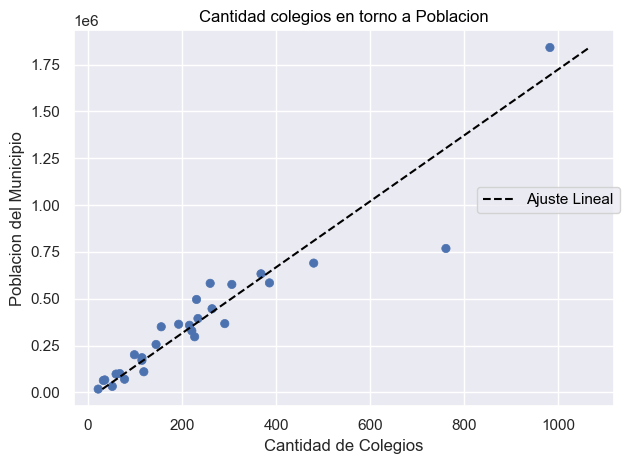

In [78]:
y , X = Formula('cantidad_colegios ~ poblacion_municipio').get_model_matrix(df_investigacion)
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]

df_investigacion["prediccion_cantidad"]=beta_0 + df_investigacion["poblacion_municipio"]*beta_1

(
    so.Plot()
    .add(so.Dot(),data=df_investigacion, x='cantidad_colegios', y='poblacion_municipio')
    .add(so.Line(color="black",linestyle='--'),data=df_investigacion,x='prediccion_cantidad',y='poblacion_municipio',label="Ajuste Lineal")
    .label(title="Cantidad colegios en torno a Poblacion",x='Cantidad de Colegios',y="Poblacion del Municipio")
).show()

**A-Veo que tan efectiva fue la regresión usando el coeficiente de determinación**

In [79]:
r2_score(df_investigacion["prediccion_cantidad"],df_investigacion["cantidad_colegios"])

0.8789177618610013

**A-Me parecio interesante ver como se comporta la regresion sin los 2 outliers que se ven en el grafico. En consecuencia realizo una nueva regresión y un grafico**

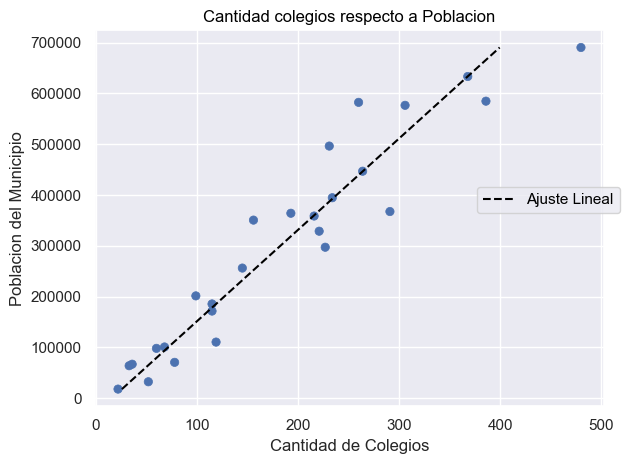

In [80]:
#Modifico el data frame original sacando los 2 outliers 
df_investigacion2=df_investigacion.copy()
indices_a_borrar = df_investigacion[df_investigacion["nombre_municipio"].isin(["La Matanza","La Plata" ])].index
df_investigacion2.drop(index=indices_a_borrar,columns="prediccion_cantidad",inplace=True)


#Aplico nuevamente la regresion Lineal a mi nuevo data frame
y , X = Formula('cantidad_colegios ~ poblacion_municipio').get_model_matrix(df_investigacion2)
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]

df_investigacion2["prediccion_cantidad2"]=beta_0 + df_investigacion2["poblacion_municipio"]*beta_1

#Realizo el grafico
(
    so.Plot()
    .add(so.Dot(),data=df_investigacion2, x='cantidad_colegios', y='poblacion_municipio')
    .add(so.Line(color="black",linestyle='--'),data=df_investigacion2,x='prediccion_cantidad2',y='poblacion_municipio',label="Ajuste Lineal")
    .label(title="Cantidad colegios respecto a Poblacion",x='Cantidad de Colegios',y="Poblacion del Municipio")
).show()

Veo que tan efectiva fue la regresión usando el coeficiente de determinación

In [81]:
r2_score(df_investigacion2["prediccion_cantidad2"],df_investigacion2["cantidad_colegios"])

0.8924272034985645

**B-Investigo si existe una relacion entre la cantidad de colegios y la repitencia.En este caso puntual uso un grafico**

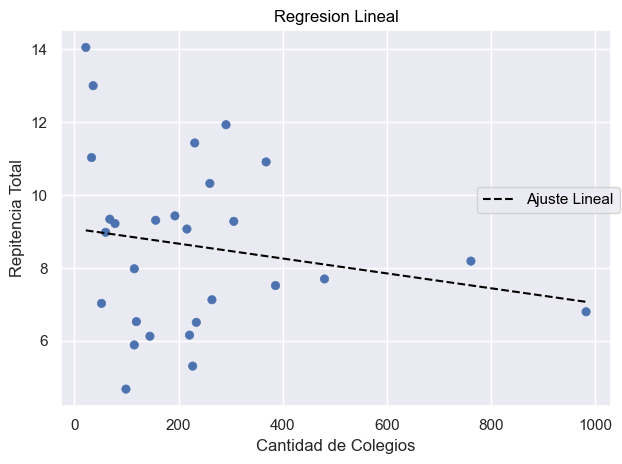

In [82]:
y , X = Formula('repitencia_total ~ cantidad_colegios').get_model_matrix(df_investigacion)
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]

df_investigacion["prediccion_repitencia"]=beta_0 + df_investigacion["cantidad_colegios"]*beta_1

(
    so.Plot()
    .add(so.Dot(),data=df_investigacion, x='cantidad_colegios', y='repitencia_total')
    .add(so.Line(color="black",linestyle='--'),data=df_investigacion,x='cantidad_colegios',y='prediccion_repitencia',label="Ajuste Lineal")
    .label(title="Regresion Lineal",x='Cantidad de Colegios',y="Repitencia Total")
).show()

**C-Investigo si existe una relacion entre la cantidad de colegios con la poblacion del municipi y la repitencia. Sabiendo que cantidad de colegios y poblacion estan relacionadas**

In [83]:
y ,X=Formula('repitencia_total ~ cantidad_colegios + poblacion_municipio').get_model_matrix(df_investigacion)
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]
beta_2 = beta[0][2]

df_investigacion["prediccion_completa"]= beta_0 + df_investigacion["cantidad_colegios"]*beta_1 + df_investigacion["poblacion_municipio"]*beta_2

Veo que tan efectiva fue la regresión usando el coeficiente de determinación

In [84]:
r2_score(df_investigacion["repitencia_total"],df_investigacion["prediccion_completa"])

0.03988758002958803

**D-Investigo si existe una relacion entre la cantidad de colegios con las transferencias y la repitencia**

In [85]:
y ,X=Formula('repitencia_total ~ cantidad_colegios + transferencia').get_model_matrix(df_investigacion)
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]
beta_2 = beta[0][2]

df_investigacion["prediccion_CyT"]= beta_0 + df_investigacion["cantidad_colegios"]*beta_1 + df_investigacion["transferencia"]*beta_2

Veo que tan efectiva fue la regresión usando el coeficiente de determinación

In [86]:
r2_score(df_investigacion["repitencia_total"],df_investigacion["prediccion_CyT"])

0.13847008427358154

**E-Investigo si existe una relacion entre las transferencias (inversión en los alumnos) y la repitencia.**

In [87]:
y , X = Formula('repitencia_total ~ transferencia').get_model_matrix(df_investigacion)
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]

df_investigacion["prediccion_RyT"]=beta_0 + df_investigacion["transferencia"]*beta_1

Veo que tan efectiva fue la regresión usando el coeficiente de determinación

In [88]:
r2_score(df_investigacion["repitencia_total"],df_investigacion["prediccion_RyT"])

0.1344527134320963